<a href="https://colab.research.google.com/github/MarianaWu01/lingyiwu.github.com/blob/main/Healthy_Home_Prediction%26Map_Visualization01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#data source https://drive.google.com/file/d/1mYhAIbVXUk8SzRKYMYnxcB6Rt09id4Bh/view

In [ ]:
!apt install gdal-bin python-gdal python3-gdal#geo info
# Install rtree - Geopandas requirment
!apt install python3-rtree#index
# Install Geopandas
!pip install git+git://github.com/geopandas/geopandas.git#geo analysis
# Install descartes - Geopandas requirment
!pip install descartes#draw shape in geo

# Geo-related libraries
!pip install geopandas
!pip install osmnx#download geo info provide api
!pip install contextily#add background image
!pip install folium#map interaction
!pip install plotly_express
!pip install geofeather#transform effecient

!pip install osmnx

# Others
!pip install matplotlib==3.1.3

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Package python-gdal is not available, but is referred to by another package.
This may mean that the package is missing, has been obsoleted, or
is only available from another source
However the following packages replace it:
  gdal-bin

E: Package 'python-gdal' has no installation candidate
E: Unable to locate package python3-gdal#geo
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package python3-rtree#index
  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-5jakqi6n
  Running command git clone --filter=blob:none --quiet git://github.com/geopandas/geopandas.git /tmp/pip-req-build-5jakqi6n


In [ ]:
# Data manipulation libraries
import os
import pandas as pd
import numpy as np

# Geo-related libraries
import geopandas as gpd
import osmnx as ox
import folium
from folium.plugins import HeatMap
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import contextily as ctx
import geofeather
from geopandas import GeoDataFrame
from shapely.geometry import Point
from shapely import wkt
from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points
from shapely import wkt

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Timer
from tqdm import tqdm, tqdm_notebook


# Regression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor


# Model support functions
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from scipy.stats import uniform
from sklearn.preprocessing import StandardScaler
from pprint import pprint
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [ ]:
df_1 = pd.read_csv("/content/Home_n_Map (3).csv")
df_1.head(5)

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


In [ ]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO value        18286 non-null  float64
 1   NO2 value       18286 non-null  float64
 2   PM2p5 value     18286 non-null  float64
 3   geometry        18286 non-null  object 
 4   road_type       18286 non-null  object 
 5   zone            18238 non-null  object 
 6   tract_name      18286 non-null  object 
 7   GEOID           18286 non-null  int64  
 8   state           18286 non-null  int64  
 9   county          18286 non-null  int64  
 10  pop_den         18286 non-null  float64
 11  wind            18270 non-null  float64
 12  temp            18270 non-null  float64
 13  Longitude       18286 non-null  float64
 14  Latitude        18286 non-null  float64
 15  Respiratory_HI  18286 non-null  object 
 16  Pt_CANCR        18286 non-null  object 
dtypes: float64(8), int64(3), object

In [ ]:
df_1.describe()

,NO value,NO2 value,PM2p5 value,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude
count,18286.000000,18286.000000,18286.000000,1.828600e+04,18286.0,18286.0,18286.000000,18270.000000,18270.000000,18286.000000,18286.000000
mean,16.491878,15.718324,16.479524,6.001438e+09,6.0,1.0,3720.118705,3.994339,15.105291,-122.229279,37.783264
std,21.172385,9.042830,3.465253,1.320293e+05,0.0,0.0,2432.086222,0.089913,0.145320,0.053221,0.031318
min,0.000000,3.284827,9.270166,6.001401e+09,6.0,1.0,8.336845,3.741667,14.508331,-122.322594,37.724663
25%,3.714862,8.905360,14.356500,6.001402e+09,6.0,1.0,1475.818172,3.941667,15.083333,-122.277570,37.752833
50%,8.000000,13.657243,15.338513,6.001408e+09,6.0,1.0,3967.269529,4.016667,15.149999,-122.249418,37.795527
75%,20.147570,20.070905,17.222709,6.001410e+09,6.0,1.0,5728.043969,4.058333,15.191667,-122.176031,37.811208
max,433.833189,60.463163,42.451667,6.001983e+09,6.0,1.0,14365.020340,4.133333,15.350001,-122.138843,37.831122


In [ ]:
gpd_1_degree = gpd.GeoDataFrame(df_1,geometry = gpd.points_from_xy(df_1.Longitude,df_1.Latitude),crs={'init':'epsg:4326'})
gpd_1_degree.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO value        18286 non-null  float64 
 1   NO2 value       18286 non-null  float64 
 2   PM2p5 value     18286 non-null  float64 
 3   geometry        18286 non-null  geometry
 4   road_type       18286 non-null  object  
 5   zone            18238 non-null  object  
 6   tract_name      18286 non-null  object  
 7   GEOID           18286 non-null  int64   
 8   state           18286 non-null  int64   
 9   county          18286 non-null  int64   
 10  pop_den         18286 non-null  float64 
 11  wind            18270 non-null  float64 
 12  temp            18270 non-null  float64 
 13  Longitude       18286 non-null  float64 
 14  Latitude        18286 non-null  float64 
 15  Respiratory_HI  18286 non-null  object  
 16  Pt_CANCR        18286 non-null  object  
dtypes: f

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


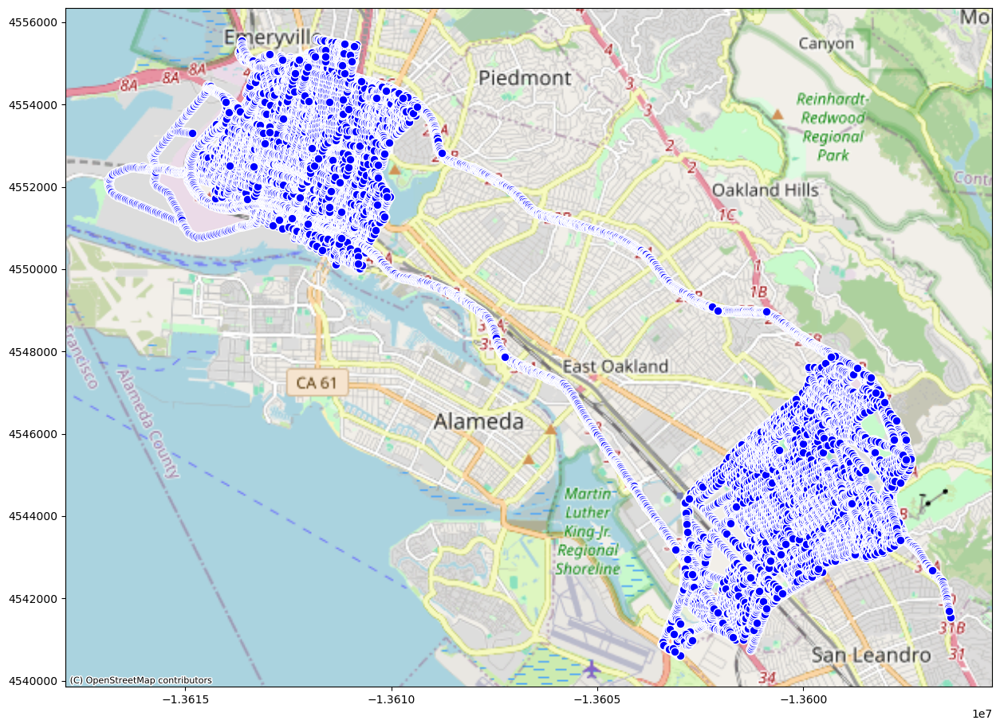

In [ ]:
fig,ax = plt.subplots(figsize=(15,12))
gpd_1_degree.to_crs(epsg=3857).plot(ax=ax,
                                    figsize=(12,12),
                                    markersize=60,
                                    color='blue',
                                    edgecolor = 'white',
                                    alpha=1,
                                    marker='o');
ctx.add_basemap(ax,source=ctx.providers.OpenStreetMap.Mapnik)

In [ ]:
#Data Cleaning

In [ ]:
df_1.head()

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


In [ ]:
df_1 = df_1.rename(columns={'NO value': 'NO'})
df_1 = df_1.rename(columns={'NO2 value': 'NO2'})
df_1 = df_1.rename(columns={'PM2p5 value': 'PM2p5'})

In [ ]:
print(df_1.nunique())

NO                16015
NO2               18226
PM2p5             18281
geometry          18281
road_type             6
zone                  5
tract_name           73
GEOID                73
state                 1
county                1
pop_den              73
wind                 45
temp                 80
Longitude         18129
Latitude          18257
Respiratory_HI        3
Pt_CANCR              3
dtype: int64


In [ ]:
df_1.head()

,NO,NO2,PM2p5,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


In [ ]:
df_1_drop = df_1.drop(['state', 'county', 'tract_name', 'GEOID'], axis=1)
df_1_drop.head(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


In [ ]:
#Deal with Missing Value

In [ ]:
print ("Num of rows: " + str(df_1_drop.shape[0])) # row
print ("Num of columns: " + str(df_1_drop.shape[1])) #col

Num of rows: 18286
Num of columns: 13


In [ ]:
print("*** Missing Values ***")
print('Sum of N/A values', df_1_drop.isnull().sum())

*** Missing Values ***
Sum of N/A values NO                 0
NO2                0
PM2p5              0
geometry           0
road_type          0
zone              48
pop_den            0
wind              16
temp              16
Longitude          0
Latitude           0
Respiratory_HI     0
Pt_CANCR           0
dtype: int64


In [ ]:
df_1_miss = df_1_drop.dropna(axis=0, subset=['zone', 'wind', 'temp'])
df_1_miss.tail()

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18281,9.733334,14.588807,9.333887,POINT (-122.2551005 37.81945168),motorway,residential,6241.318446,3.950000,15.049999,-122.255100,37.819452,low,< 0.4
18282,12.857143,15.188906,11.007707,POINT (-122.2360319 37.77631239),motorway,mixed,2351.277070,4.091667,15.166668,-122.236032,37.776312,low,< 0.4
18283,9.591837,15.566772,9.922039,POINT (-122.178876 37.78403392),motorway,residential,2277.042655,3.833333,14.608333,-122.178876,37.784034,low,< 0.4
18284,9.333333,9.039947,11.325624,POINT (-122.15509 37.77013811),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18285,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [ ]:
df_1_miss = df_1_miss.reset_index()
df_1_miss.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18222 entries, 0 to 18221
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           18222 non-null  int64  
 1   NO              18222 non-null  float64
 2   NO2             18222 non-null  float64
 3   PM2p5           18222 non-null  float64
 4   geometry        18222 non-null  object 
 5   road_type       18222 non-null  object 
 6   zone            18222 non-null  object 
 7   pop_den         18222 non-null  float64
 8   wind            18222 non-null  float64
 9   temp            18222 non-null  float64
 10  Longitude       18222 non-null  float64
 11  Latitude        18222 non-null  float64
 12  Respiratory_HI  18222 non-null  object 
 13  Pt_CANCR        18222 non-null  object 
dtypes: float64(8), int64(1), object(5)
memory usage: 1.9+ MB


In [ ]:
df_1_miss = df_1_miss.drop(['index'],axis = 1)

In [ ]:
#Duplicated Values

In [ ]:
print ("Num of rows: " + str(df_1_miss.shape[0])) # row count
print ("Num of columns: " + str(df_1_miss.shape[1])) # col count

Num of rows: 18222
Num of columns: 13


In [ ]:
df_1_miss[df_1_miss.duplicated()]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
174,32.059862,24.190178,19.514652,POINT (-122.308528 37.81502824),secondary,industrial,220.026011,4.125000,15.000001,-122.308528,37.815028,high,0.7 - 0.8
504,16.426667,19.134740,18.727645,POINT (-122.3001287 37.80641093),secondary,mixed,3520.358174,4.083333,15.083335,-122.300129,37.806411,high,0.7 - 0.8
7161,92.638344,45.426999,28.987625,POINT (-122.233788 37.77509246),motorway,mixed,2351.277070,4.091667,15.166668,-122.233788,37.775092,high,0.7 - 0.8


In [ ]:
df_1_miss.iloc[[0,-1]]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [ ]:
df_1_dup = df_1_miss.drop_duplicates()
df_1_dup.tail(3)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18219,9.591837,15.566772,9.922039,POINT (-122.178876 37.78403392),motorway,residential,2277.042655,3.833333,14.608333,-122.178876,37.784034,low,< 0.4
18220,9.333333,9.039947,11.325624,POINT (-122.15509 37.77013811),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [ ]:
df_1_dup.reset_index(inplace=True)
df_1_dup[df_1_dup.duplicated()]

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR


In [ ]:
df_1_dup.iloc[[0,-1]]

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
18218,18221,18.842105,16.122072,9.270166,POINT (-122.1390328 37.73246375),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [ ]:
#outliers

In [ ]:
df_1_out = df_1_dup.copy()
df_1_out.head()

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


In [ ]:
df_1_out.loc[df_1_out['NO'] > 200, 'NO'] = 200

In [ ]:
print(df_1_out)

       index         NO        NO2      PM2p5  \
0          0  23.390071  17.539762  17.612700   
1          1  19.700000  19.956750  15.946719   
2          2  23.611111  23.967768  16.210698   
3          3  15.714285  18.435184  15.561862   
4          4  27.108695  25.797037  17.120884   
...      ...        ...        ...        ...   
18214  18217   9.733334  14.588807   9.333887   
18215  18218  12.857143  15.188906  11.007707   
18216  18219   9.591837  15.566772   9.922039   
18217  18220   9.333333   9.039947  11.325624   
18218  18221  18.842105  16.122072   9.270166   

                                     geometry  road_type         zone  \
0            POINT (-122.3225938 37.80678062)   tertiary   industrial   
1              POINT (-122.32231 37.80614989)  secondary   industrial   
2            POINT (-122.3223008 37.80642014)  secondary   industrial   
3      POINT (-122.3222988 37.80587979999999)  secondary   industrial   
4            POINT (-122.3222671 37.80668898) 

In [ ]:
#Feature Engineering

In [ ]:
Oakland_poly = ox.geocode_to_gdf('Oakland, California')
Oakland_poly

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"POLYGON ((-122.35588 37.83573, -122.35009 37.8...",37.885426,37.633676,-122.11442,-122.355881,311948230,relation,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."


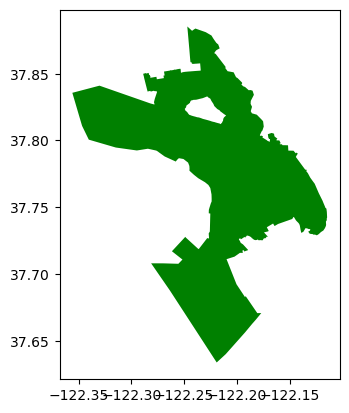

In [ ]:
Oakland_poly.plot(color = 'green')

In [ ]:
gpd_1_degree = gpd.GeoDataFrame(df_1,geometry = gpd.points_from_xy(df_1.Longitude,df_1.Latitude),crs={'init':'epsg:4326'})
gpd_1_degree.info()
Oakland_poly.crs, gpd_1_degree.crs

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO              18286 non-null  float64 
 1   NO2             18286 non-null  float64 
 2   PM2p5           18286 non-null  float64 
 3   geometry        18286 non-null  geometry
 4   road_type       18286 non-null  object  
 5   zone            18238 non-null  object  
 6   tract_name      18286 non-null  object  
 7   GEOID           18286 non-null  int64   
 8   state           18286 non-null  int64   
 9   county          18286 non-null  int64   
 10  pop_den         18286 non-null  float64 
 11  wind            18270 non-null  float64 
 12  temp            18270 non-null  float64 
 13  Longitude       18286 non-null  float64 
 14  Latitude        18286 non-null  float64 
 15  Respiratory_HI  18286 non-null  object  
 16  Pt_CANCR        18286 non-null  object  
dtypes: f

(<Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich,
 <Geographic 2D CRS: +init=epsg:4326 +type=crs>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - lon[east]: Longitude (degree)
 - lat[north]: Latitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

In [ ]:
gpd_1_degree.head()

,NO,NO2,PM2p5,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


In [ ]:
#spartial join

In [ ]:
gpd_1_city = gpd.sjoin(gpd_1_degree,Oakland_poly,how = 'inner',op='intersects')
gpd_1_city.head()

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-142-5ba2346cfd00>:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  gpd_1_city = gpd.sjoin(gpd_1_degree,Oakland_poly,how = 'inner',op='intersects')


,NO,NO2,PM2p5,geometry,road_type,zone,tract_name,GEOID,state,county,...,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."


In [ ]:
print(gpd_1_city.nunique())

NO                16008
NO2               18218
PM2p5             18272
geometry          18272
road_type             6
zone                  5
tract_name           73
GEOID                73
state                 1
county                1
pop_den              73
wind                 45
temp                 80
Longitude         18120
Latitude          18248
Respiratory_HI        3
Pt_CANCR              3
index_right           1
bbox_north            1
bbox_south            1
bbox_east             1
bbox_west             1
place_id              1
osm_type              1
osm_id                1
lat                   1
lon                   1
class                 1
type                  1
place_rank            1
importance            1
addresstype           1
name                  1
display_name          1
dtype: int64


In [ ]:
gpd_1_city = gpd_1_city.drop(['index_right', 'bbox_east', 'bbox_north', 'bbox_south', 'bbox_west'], axis=1)

In [ ]:
gpd_1_city

,NO,NO2,PM2p5,geometry,road_type,zone,tract_name,GEOID,state,county,...,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18281,9.733334,14.588807,9.333887,POINT (-122.25510 37.81945),motorway,residential,"Census Tract 4035.01, Alameda County, California",6001403501,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
18282,12.857143,15.188906,11.007707,POINT (-122.23603 37.77631),motorway,mixed,"Census Tract 4061, Alameda County, California",6001406100,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
18283,9.591837,15.566772,9.922039,POINT (-122.17888 37.78403),motorway,residential,"Census Tract 4079, Alameda County, California",6001407900,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."
18284,9.333333,9.039947,11.325624,POINT (-122.15509 37.77014),motorway,residential,"Census Tract 4098, Alameda County, California",6001409800,6,1,...,2833530,37.804456,-122.271356,boundary,administrative,16,0.631796,city,Oakland,"Oakland, Alameda County, California, United St..."


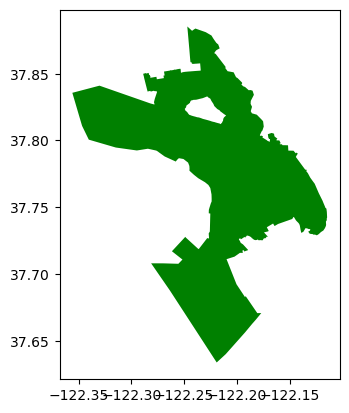

In [ ]:
Oakland_poly.plot(color = 'green')

In [ ]:
#City Structure:Roads

In [ ]:
oak_streets = ox.graph_from_place('Oakland California',network_type = 'drive')
nodes, edges = ox.graph_to_gdfs(oak_streets)

In [ ]:
nodes.head()

,y,x,highway,street_count,ref,geometry
osmid,,,,,,
30362160,37.824005,-122.303118,motorway_junction,3,NaN,POINT (-122.30312 37.82400)
30362888,37.825844,-122.303049,motorway_junction,3,8A,POINT (-122.30305 37.82584)
30363957,37.825477,-122.307034,NaN,3,NaN,POINT (-122.30703 37.82548)
30364093,37.825462,-122.307568,NaN,3,NaN,POINT (-122.30757 37.82546)
30364111,37.823569,-122.302980,NaN,3,NaN,POINT (-122.30298 37.82357)


In [ ]:
edges.head()

osmid bridge  oneway  \
u        v          key                                                   
30362160 30365945   0    [4757680, 781148889, 710721718]    yes    True   
         30366047   0                           32661316    yes    True   
30362888 1943438853 0                          710721717    NaN    True   
         30363957   0                            4757566    NaN    True   
30363957 30364093   0               [11192289, 11192284]    NaN    True   

                          lanes        highway maxspeed reversed   length  \
u        v          key                                                     
30362160 30365945   0    [1, 2]  motorway_link   55 mph    False  741.848   
         30366047   0         2       motorway   55 mph    False  175.700   
30362888 1943438853 0         7       motorway   50 mph    False  135.576   
         30363957   0         1  motorway_link   50 mph    False  352.533   
30363957 30364093   0       NaN  motorway_link   50 mph    False   67.719   

                                                                  geometry  \
u        v          key                                                      
30362160 30365945   0    LINESTRING (-122.30312 37.82400, -122.30418 37...   
         30366047   0    LINESTRING (-122.30312 37.82400, -122.30400 37...   
30362888 1943438853 0    LINESTRING (-122.30305 37.82584, -122.30455 37...   
         30363957   0    LINESTRING (-122.30305 37.82584, -122.30463 37...   
30363957 30364093   0    LINESTRING (-122.30703 37.82548, -122.30711 37...   

                          ref name tunnel access junction width  
u        v          key                                          
30362160 30365945   0     NaN  NaN    NaN    NaN      NaN   NaN  
         30366047   0     NaN  NaN    NaN    NaN      NaN   NaN  
30362888 1943438853 0    I 80  NaN    NaN    NaN      NaN   NaN  
         30363957   0     NaN  NaN    NaN    NaN      NaN   NaN  
30363957 30364093   0     NaN  NaN    NaN    NaN      NaN   NaN

In [ ]:
oak_streets = ox.graph_from_place('Oakland California',network_type = 'walk')
nodes, edges = ox.graph_to_gdfs(oak_streets)

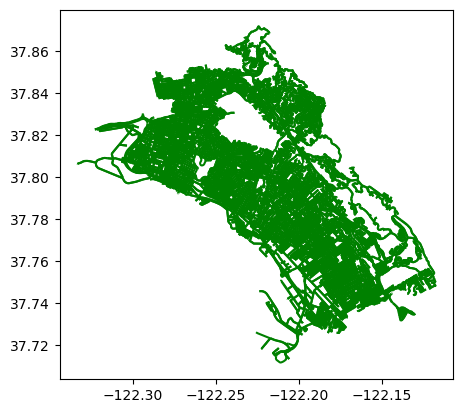

In [ ]:
edges.plot(color= 'green')

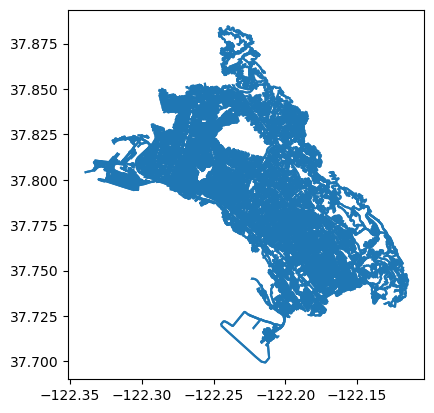

In [ ]:
edges.plot()

In [ ]:
oakland_rds = edges.copy()
print(oakland_rds['highway'].value_counts())
print ("Num of rows: " + str(oakland_rds.shape[0])) # row count
print ("Num of columns: " + str(oakland_rds.shape[1])) # col count

residential                        14908
secondary                           2896
tertiary                            2490
primary                              776
motorway_link                        325
unclassified                         243
motorway                             206
secondary_link                        96
trunk                                 62
tertiary_link                         40
trunk_link                            39
living_street                         24
primary_link                          14
[unclassified, residential]            4
[motorway_link, motorway]              2
[residential, living_street]           1
[motorway_link, secondary_link]        1
[secondary_link, motorway_link]        1
[living_street, residential]           1
Name: highway, dtype: int64
Num of rows: 22129
Num of columns: 15


In [ ]:
oakland_rds['highway'] = oakland_rds['highway'].str.replace('_link', '')
# 'trunk'  -->  'secondary'
oakland_rds['highway'] = np.where(oakland_rds['highway'] == 'trunk', 'secondary', oakland_rds['highway'])
# 'living_street' --> 'residential'
oakland_rds['highway'] = np.where(oakland_rds['highway'] == 'living_street', 'residential', oakland_rds['highway'])
# Check result
print(oakland_rds['highway'].value_counts())

residential     14932
secondary        3093
tertiary         2530
primary           790
motorway          531
unclassified      243
Name: highway, dtype: int64


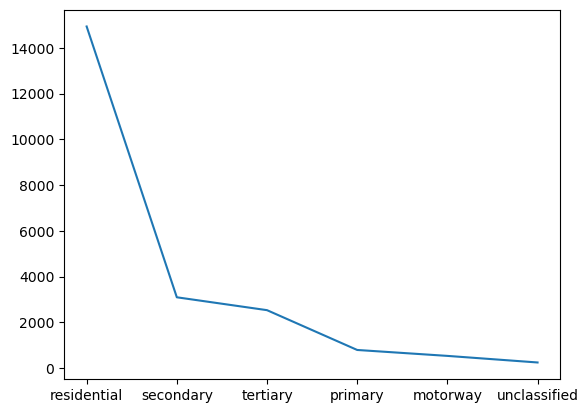

In [ ]:
oakland_rds['highway'].value_counts().plot()

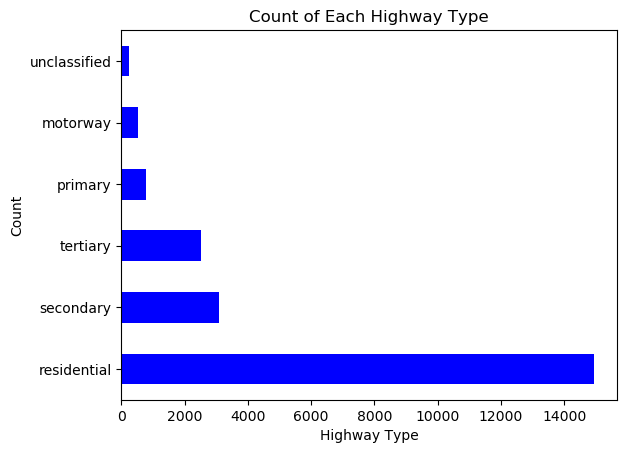

In [ ]:
oakland_rds['highway'].value_counts().plot(kind='barh',color ='blue')
plt.xlabel('Highway Type')
plt.ylabel('Count')
plt.title('Count of Each Highway Type')
plt.show()

In [ ]:
#map

In [ ]:
oakland_highways = oakland_rds[oakland_rds.highway == 'motorway']
oakland_primary = oakland_rds[oakland_rds.highway == 'primary']
oakland_secondary = oakland_rds[oakland_rds.highway == 'secondary']
oakland_tertiary = oakland_rds[oakland_rds.highway == 'tertiary']
oakland_resid = oakland_rds[oakland_rds.highway == 'residential']

oakland_highways.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

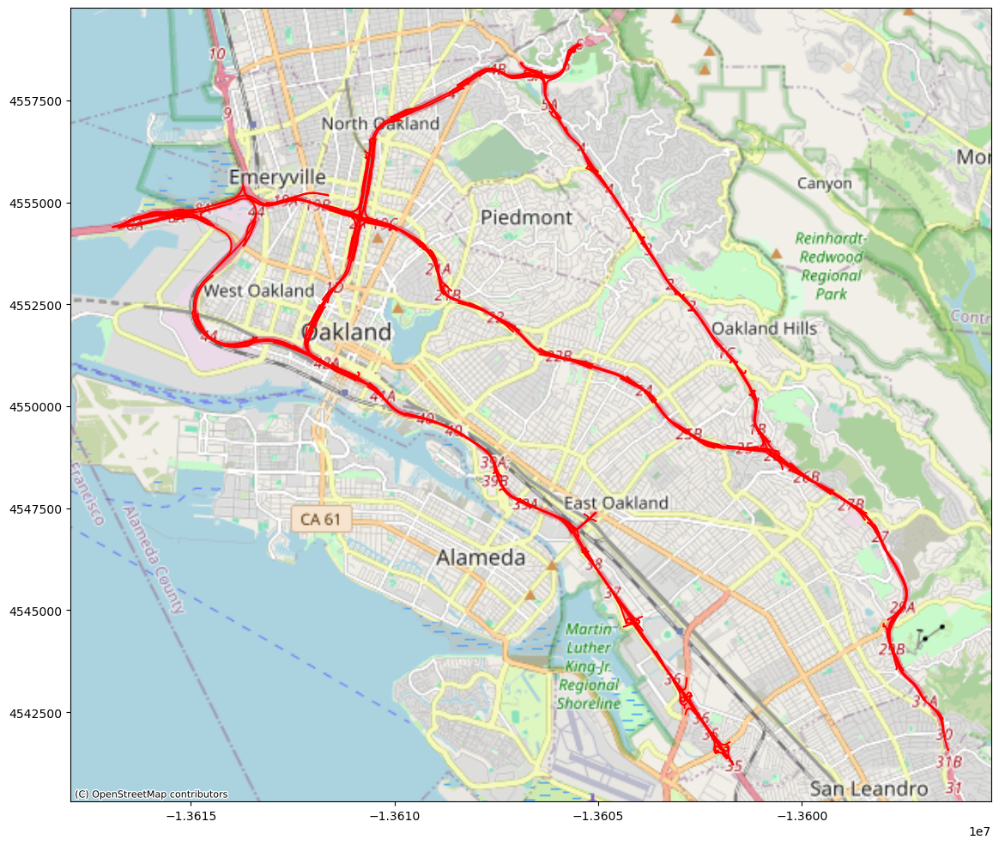

In [ ]:
fig,ax = plt.subplots(figsize=(15,12))#comma between fig and ax
oakland_highways.to_crs(epsg =3857).plot(ax=ax,
                              figsize = (12,12),
                              markersize = 60,
                            color = 'red',
                            edgecolor = 'white',
                            alpha = 1,
                            marker = 'o'
                            );
ctx.add_basemap(ax,source = ctx.providers.OpenStreetMap.Mapnik)

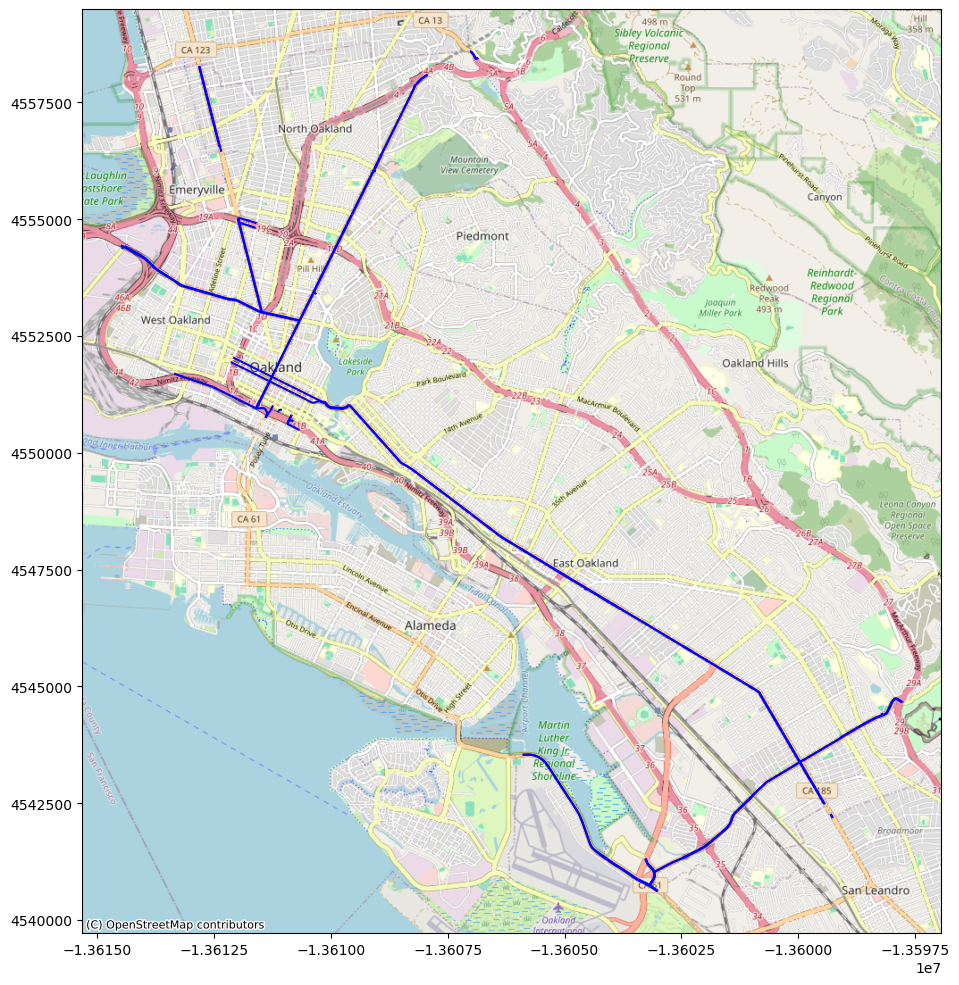

In [ ]:
fig,ax = plt.subplots(figsize=(15,12))#comma between fig and ax
oakland_primary.to_crs(epsg =3857).plot(ax=ax,
                              figsize = (12,12),
                              markersize = 60,
                            color = 'blue',
                            edgecolor = 'white',
                            alpha = 1,
                            marker = 'o'
                            );
ctx.add_basemap(ax,source = ctx.providers.OpenStreetMap.Mapnik)

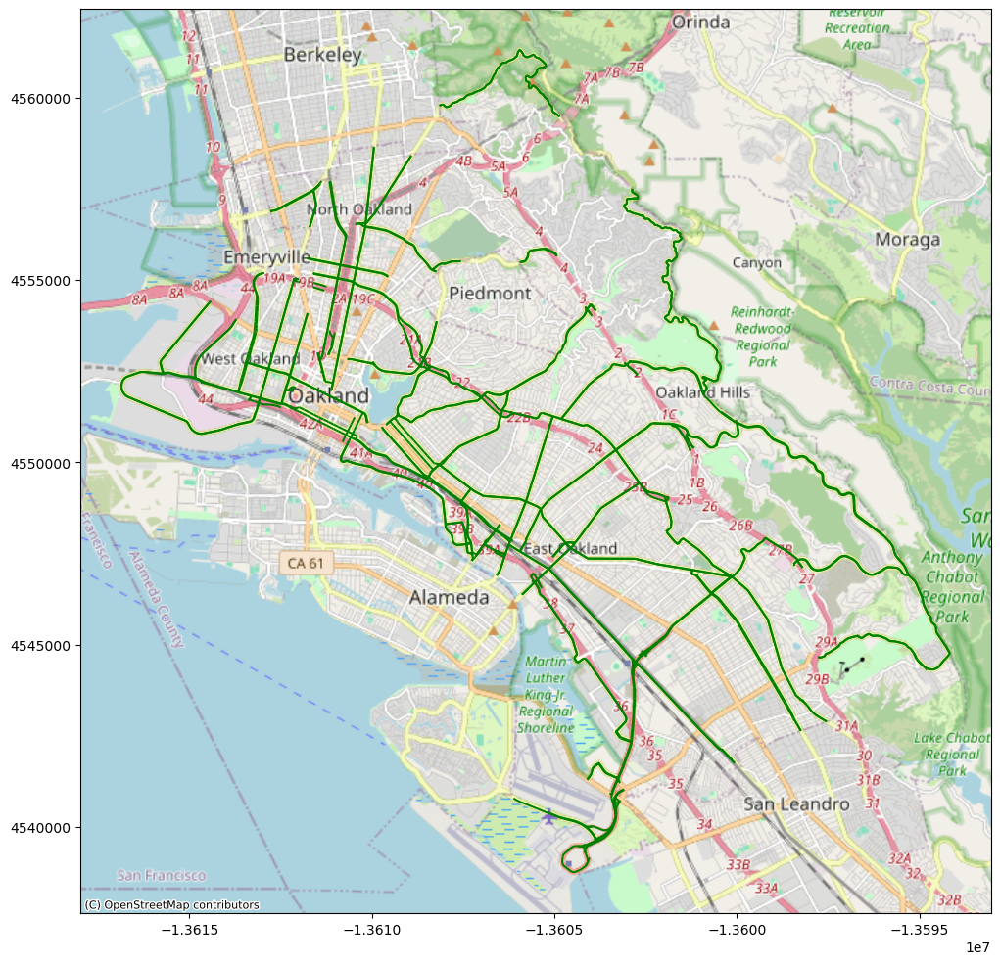

In [ ]:
fig,ax = plt.subplots(figsize=(15,12))#comma between fig and ax
oakland_secondary.to_crs(epsg =3857).plot(ax=ax,
                              figsize = (12,12),
                              markersize = 60,
                            color = 'green',
                            edgecolor = 'white',
                            alpha = 1,
                            marker = 'o'
                            );
ctx.add_basemap(ax,source = ctx.providers.OpenStreetMap.Mapnik)

In [ ]:
fig,ax = plt.subplots(figsize=(15,12))#comma between fig and ax
oakland_primary.to_crs(epsg =3857).plot(ax=ax,
                              figsize = (12,12),
                              markersize = 60,
                            color = 'black',
                            edgecolor = 'white',
                            alpha = 1,
                            marker = 'o'
                            );
ctx.add_basemap(ax,source = ctx.providers.OpenStreetMap.Mapnik)
fig,ax = plt.subplots(figsize=(15,12))#comma between fig and ax
oakland_highways.to_crs(epsg =3857).plot(ax=ax,
                              figsize = (12,12),
                              markersize = 60,
                            color = 'orange',
                            edgecolor = 'white',
                            alpha = 1,
                            marker = 'o'
                            );
ctx.add_basemap(ax,source = ctx.providers.OpenStreetMap.Mapnik)

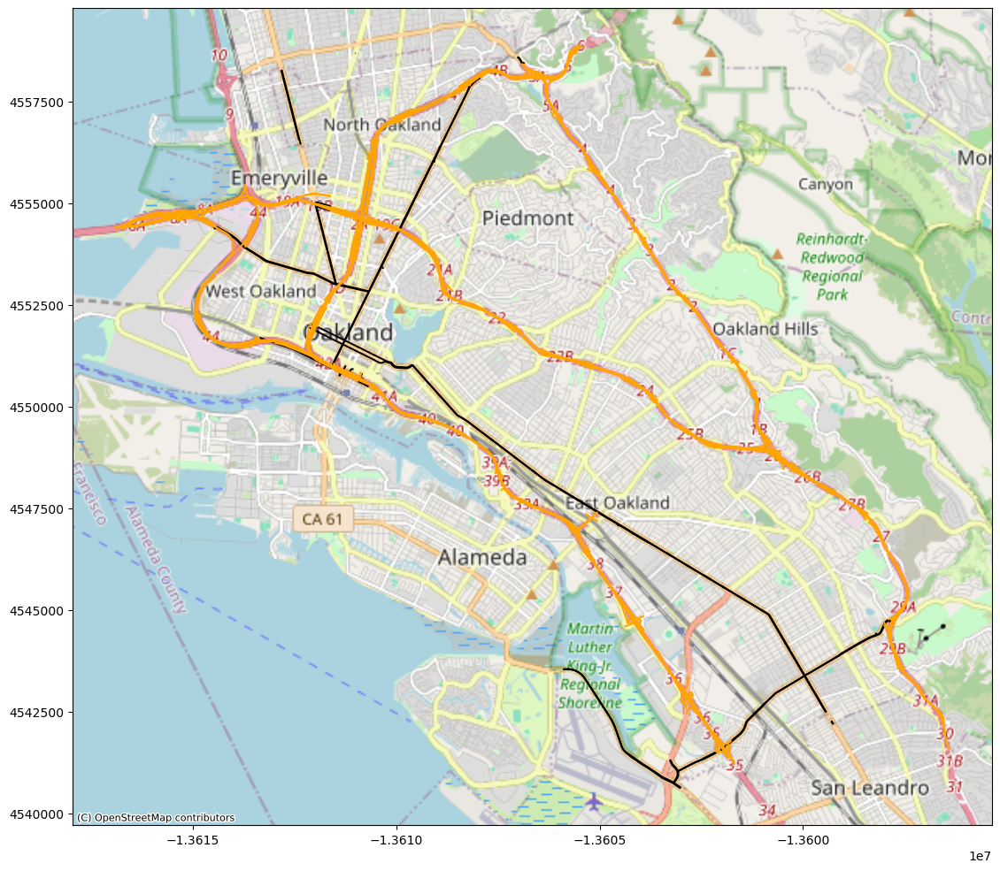

In [ ]:
fig,ax = plt.subplots(figsize=(15,12))#comma between fig and ax
oakland_primary.to_crs(epsg =3857).plot(ax=ax,
                              figsize = (12,12),
                              markersize = 60,
                            color = 'black',
                            edgecolor = 'white',
                            alpha = 1,
                            marker = 'o'
                            );
oakland_highways.to_crs(epsg =3857).plot(ax=ax,
                              figsize = (12,12),
                              markersize = 60,
                            color = 'orange',
                            edgecolor = 'white',
                            alpha = 1,
                            marker = 'o'
                            );
ctx.add_basemap(ax,source = ctx.providers.OpenStreetMap.Mapnik)

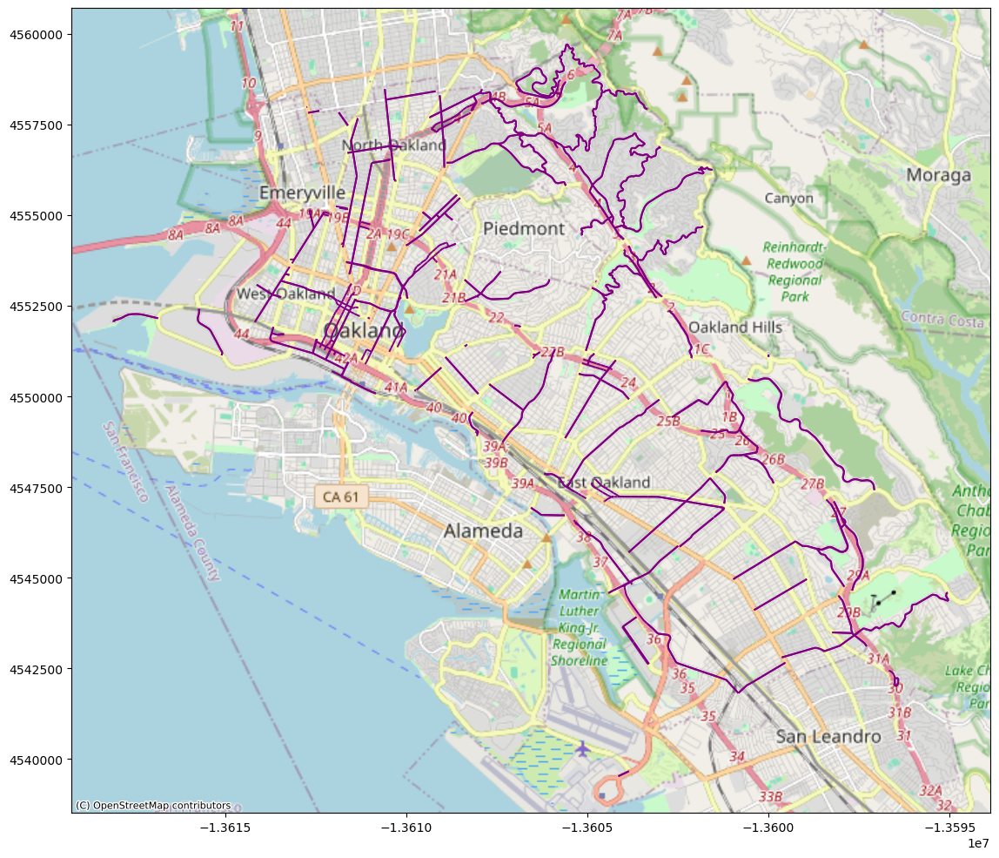

In [ ]:
fig,ax = plt.subplots(figsize=(15,12))#comma between fig and ax
oakland_tertiary.to_crs(epsg =3857).plot(ax=ax,
                              figsize = (12,12),
                              markersize = 60,
                            color = 'purple',
                            edgecolor = 'white',
                            alpha = 1,
                            marker = 'o'
                            );
ctx.add_basemap(ax,source = ctx.providers.OpenStreetMap.Mapnik)

In [ ]:
#road distance

In [ ]:
gpd_1_city.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
gpd_1_city_utm = gpd_1_city.to_crs({'init': 'epsg:32610'}).copy()      # much faster to do the re-projection to meters
highway_utm = oakland_highways.to_crs({'init': 'epsg:32610'}).copy()
primary_utm = oakland_primary.to_crs({'init': 'epsg:32610'}).copy()
secondary_utm = oakland_secondary.to_crs({'init': 'epsg:32610'}).copy()
tertiary_utm = oakland_tertiary.to_crs({'init': 'epsg:32610'}).copy()

/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [ ]:
def distance_to_roadway(gps,roadway):
  dists = []
  for i in roadway.geometry:
    dists.append(i.distance(gps))
  return(np.min(dists))

In [ ]:
tqdm.pandas()
gpd_1_city['closest_highway'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = highway_utm)

100%|██████████| 18277/18277 [03:56<00:00, 77.17it/s] 


In [ ]:
tqdm.pandas()
gpd_1_city['closest_highway'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = primary_utm)

100%|██████████| 18277/18277 [05:01<00:00, 60.60it/s]


In [ ]:
tqdm.pandas()
gpd_1_city['closest_highway'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = secondary_utm)

100%|██████████| 18277/18277 [18:25<00:00, 16.54it/s]


In [ ]:
tqdm.pandas()
gpd_1_city['closest_highway'] = gpd_1_city_utm['geometry'].progress_apply(distance_to_roadway, roadway = tertiary_utm)

In [ ]:
gpd_1_city.head()

In [ ]:
#city structure:traffic signal&stop sign